In [1]:
import pandas as pd
import numpy as np

# Data frame film oriented

In [2]:
#'tconst', 'isAdult', 'startYear',
#'runtimeMinutes', 'genre_1', 'genre_2', 'genre_3', 'directors', 'title',
#'averageRating', 'numVotes'

## Title_basics

In [3]:
# Import bdd
df_title_basics = df_title_basics = pd.read_csv("https://datasets.imdbws.com/title.basics.tsv.gz", sep = '\t')

/var/folders/yr/dsr18bzx5rg852j0z08l7d300000gn/T/ipykernel_60171/3336043860.py:2: DtypeWarning: Columns (4) have mixed types. Specify dtype option on import or set low_memory=False.
  df_title_basics = df_title_basics = pd.read_csv("https://datasets.imdbws.com/title.basics.tsv.gz", sep = '\t')


In [4]:
# Delete column "endYear"
df_title_basics.drop("endYear", axis=1, inplace=True)

In [5]:
# Delete rows where genre != "movie"
df_title_basics = df_title_basics.loc[df_title_basics["titleType"] == "movie", :]

In [6]:
# We can now delete "titleType" column
df_title_basics.drop("titleType", axis=1, inplace=True)

In [7]:
# Checking Nan values
df_title_basics.isna().sum()
## No Nan values

tconst            0
primaryTitle      0
originalTitle     0
isAdult           0
startYear         0
runtimeMinutes    0
genres            0
dtype: int64

In [8]:
# Checking columns type
def get_unique_column_types(df, col_name):
    """
    Returns a list of the unique types of values in the specified column of the DataFrame.

    Parameters:
    df (pandas.DataFrame): The DataFrame containing the column.
    col_name (str): The name of the column to check.

    Returns:
    list: A list of the unique types of values in the column.
    """
    unique_types = df[col_name].apply(type).unique()
    return unique_types

# List of column names in the DataFrame
column_names = df_title_basics.columns.tolist()

# Iterate over each column name and print the unique types of values in that column
for col_name in column_names:
    types = get_unique_column_types(df_title_basics, col_name)
    print(f"The column '{col_name}' has the following unique types of values: {types}")

The column 'tconst' has the following unique types of values: [<class 'str'>]
The column 'primaryTitle' has the following unique types of values: [<class 'str'>]
The column 'originalTitle' has the following unique types of values: [<class 'str'>]
The column 'isAdult' has the following unique types of values: [<class 'int'> <class 'str'>]
The column 'startYear' has the following unique types of values: [<class 'str'>]
The column 'runtimeMinutes' has the following unique types of values: [<class 'str'>]
The column 'genres' has the following unique types of values: [<class 'str'>]


In [9]:
# Convert "startYear" as int for using as condition
# Delete rows where "starYear" value is not convertible to int

# convert everything to numeric value and give Nan values when it's not possible
df_title_basics["startYear"] = pd.to_numeric(df_title_basics["startYear"], errors='coerce')
df_title_basics = df_title_basics.dropna(subset=["startYear"])
# convert to int because I don't want floats
df_title_basics["startYear"] = df_title_basics["startYear"].astype(int)

In [10]:
# Split the column "genres"
split_genre = df_title_basics["genres"].str.split(",", expand=True)
split_genre.rename(columns={0 : "genre_1", 1 : "genre_2", 2 : "genre_3"}, inplace=True)

df_title_basics = pd.concat([df_title_basics, split_genre], axis=1)


In [11]:
# Drop column "genres" because unusable
df_title_basics.drop("genres", axis=1, inplace=True)

In [12]:
# Check duplicates
df_title_basics.duplicated().sum()
## No duplicates

0

## Merge "directors" column from title_crew

In [13]:
df_title_crew = pd.read_csv("https://datasets.imdbws.com/title.crew.tsv.gz", sep = '\t')


In [14]:
# Check duplicates on Key 
print(df_title_crew["tconst"].duplicated().sum())
print(df_title_basics["tconst"].duplicated().sum())

0
0


In [15]:
# Merge column "directors" drom df_title_crew on df_title_basics with inner join to avoid duplicates
df_title_basics = df_title_basics.merge(df_title_crew[["directors", "tconst"]], how="inner", on="tconst")

## Merge "title" and "region" column from title_akas

In [16]:

df_title_akas = pd.read_csv("https://datasets.imdbws.com/title.akas.tsv.gz", sep = '\t')

/var/folders/yr/dsr18bzx5rg852j0z08l7d300000gn/T/ipykernel_60171/2466345820.py:1: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df_title_akas = pd.read_csv("https://datasets.imdbws.com/title.akas.tsv.gz", sep = '\t')


In [17]:
# Check Nan values
df_title_akas.isna().sum()
# Some Nan values

titleId              0
ordering             0
title                5
region             111
language             0
types                0
attributes           0
isOriginalTitle      0
dtype: int64

In [18]:
# Keep only the movies from "region" == FR
df_title_akas = df_title_akas.loc[df_title_akas["region"] == "FR", ["titleId", "title", "region"]]

In [19]:
# Merge the column "titleId", "title" and "region" on df_title_basics with inner join
df_title_basics = df_title_basics.merge(df_title_akas[["titleId", "title", "region"]], how="inner",
                                        left_on="tconst", right_on="titleId")

In [20]:
# Drop duplicates
df_title_basics.drop_duplicates(keep="first", subset="tconst", inplace=True)

In [21]:
# Check duplicates
df_title_basics.duplicated().sum()
## No duplicates on "tconst"

0

In [22]:
# We can drop "titleId" because it was used for join, and "region" because everything is FR
df_title_basics = df_title_basics.drop(["titleId", "region"], axis=1)


## Merge "averageRating" and "numvotes" columns from title_ratings

In [23]:
df_title_ratings = pd.read_csv("https://datasets.imdbws.com/title.ratings.tsv.gz", sep = '\t')


In [24]:
# Check duplicates on tconst
df_title_ratings["tconst"].duplicated().sum()
## No dupicates

0

In [25]:
# Check Nan values
df_title_ratings.isna().sum()
## No Nan values

tconst           0
averageRating    0
numVotes         0
dtype: int64

In [26]:
# Merge the column "averageRating" and "numVotes" on df_title_basics
df_title_basics = df_title_basics.merge(df_title_ratings[["tconst", "averageRating", "numVotes"]], 
                                        how="inner", on="tconst")

In [27]:
# Drop "primaryTitle" and "originalTitle" because no use
df_title_basics.drop(["primaryTitle", "originalTitle"], axis=1, inplace=True)

In [28]:
# Check duplicates on "tconst"
df_title_basics["tconst"].duplicated().sum()
## No duplicates

0

## Delete 'Adult' genre to not get porn movies

In [29]:
mask = (df_title_basics['genre_1'] == 'Adult')
mask_2 = (df_title_basics['genre_2'] == 'Adult')
mask_3 = (df_title_basics['genre_3'] == 'Adult')

df_title_basics = df_title_basics.drop(df_title_basics[mask].index)
df_title_basics = df_title_basics.drop(df_title_basics[mask_2].index)
df_title_basics = df_title_basics.drop(df_title_basics[mask_3].index)

/var/folders/yr/dsr18bzx5rg852j0z08l7d300000gn/T/ipykernel_60171/2106324030.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_title_basics = df_title_basics.drop(df_title_basics[mask_2].index)
/var/folders/yr/dsr18bzx5rg852j0z08l7d300000gn/T/ipykernel_60171/2106324030.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_title_basics = df_title_basics.drop(df_title_basics[mask_3].index)


## Merge "primaryName" columns to get directors name

In [30]:
# Import bdd
df_name_basics = pd.read_csv("https://datasets.imdbws.com/name.basics.tsv.gz", sep = '\t')

In [31]:
df_title_basics = df_title_basics.merge(df_name_basics[["nconst", "primaryName"]], 
                                        how="inner", left_on="directors", right_on="nconst")
df_title_basics.drop("nconst", axis=1, inplace=True)

## Export my film oriented data frame

In [32]:
df_title_basics.to_csv('film_oriented.csv')

# Data frame actor oriented

In [33]:
#'nconst', 'category', 'primaryName', 'film_1', 'film_2', 'film_3',
#'film_4', 'film_5', 'film_6'

## title principals

In [34]:
# Import bdd
df_title_principals = pd.read_csv("https://datasets.imdbws.com/title.principals.tsv.gz", sep = '\t')


In [35]:
# Delete "ordering", "job", "characters" because no use of it
df_title_principals.drop(["tconst", "ordering", "job", "characters"], axis=1, inplace=True)

In [36]:
# Delete all rows that are not "actor" or "actress"
df_title_principals = df_title_principals.loc[df_title_principals["category"].isin(["actor", "actress"]), :]

In [37]:
# drop duplicates
df_title_principals.drop_duplicates(subset="nconst", keep="first", inplace=True)

In [38]:
# Check duplicates
df_title_principals["nconst"].duplicated().sum()
## No duplicates on "nconst"

0

## Merge "primaryName" and "knownForTitles" columns from name basics

In [39]:
# Import bdd
df_name_basics = pd.read_csv("https://datasets.imdbws.com/name.basics.tsv.gz", sep = '\t')


In [40]:
# Keep only "nconst" and "primaryName"
df_name_basics.drop(["birthYear", "deathYear", "primaryProfession"], axis=1, inplace=True)

In [41]:
# Split "knownForTitles" column to make it usable
split_knownForTitles = df_name_basics["knownForTitles"].str.split(",", expand=True)

In [42]:
# Rename columns
split_knownForTitles.rename(columns={0 : "film_1", 1 : "film_2", 2 : "film_3",
                                     3 : "film_4", 4 : "film_5", 5 : "film_6"}, inplace=True)

In [43]:
# Add splited column in df_name_basics
df_name_basics = pd.concat([df_name_basics, split_knownForTitles], axis=1)

In [44]:
# Delete "knownForTitles" because not usefull anymore
df_name_basics.drop("knownForTitles", axis=1, inplace=True)

In [45]:
# Merge "primaryName" and splited "knownForTitles" on df_title_principals
df_title_principals = df_title_principals.merge(df_name_basics, how="inner", on="nconst")

In [46]:
df_name_basics

,nconst,primaryName,film_1,film_2,film_3,film_4,film_5,film_6
0,nm0000001,Fred Astaire,tt0053137,tt0072308,tt0050419,tt0045537,None,None
1,nm0000002,Lauren Bacall,tt0075213,tt0038355,tt0037382,tt0117057,None,None
2,nm0000003,Brigitte Bardot,tt0054452,tt0057345,tt0049189,tt0056404,None,None
3,nm0000004,John Belushi,tt0080455,tt0072562,tt0077975,tt0078723,None,None
4,nm0000005,Ingmar Bergman,tt0050986,tt0050976,tt0060827,tt0069467,None,None
...,...,...,...,...,...,...,...,...
12548284,nm9993714,Romeo del Rosario,tt14069590,tt2455546,tt11657662,None,None,None
12548285,nm9993716,Essias Loberg,\N,None,None,None,None,None
12548286,nm9993717,Harikrishnan Rajan,tt8736744,None,None,None,None,None
12548287,nm9993718,Aayush Nair,tt8736744,None,None,None,None,None


## Export my actor oriented data frame

In [47]:
df_title_principals.to_csv('actor_oriented.csv')

# Visualisations & KPIS

In [48]:
#Import the librairies
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

df_actor = df_title_principals
df_movie = df_title_basics

## AverageRating mean by movies genre

In [49]:
#AverageRating mean by movie genre, round with 1 decimal
grouped_data = df_movie.groupby('genre_1')

weighted_avg = grouped_data.apply(lambda x: np.average(x['averageRating'], weights=x['numVotes']))

avg_rating_genre_sorted = weighted_avg.sort_values(ascending=False)

avg_rating_genre_sorted

genre_1
Film-Noir      7.704167
Mystery        7.697590
Animation      7.621899
Biography      7.563410
Western        7.560158
Crime          7.518885
Documentary    7.400757
Drama          7.371424
Adventure      7.167952
Action         6.933943
Family         6.878521
Sci-Fi         6.855737
Romance        6.778407
Comedy         6.743675
Musical        6.689226
Fantasy        6.591690
Music          6.566962
History        6.479505
Horror         6.363413
War            6.308826
Thriller       5.963385
\N             5.933084
Sport          5.852174
dtype: float64

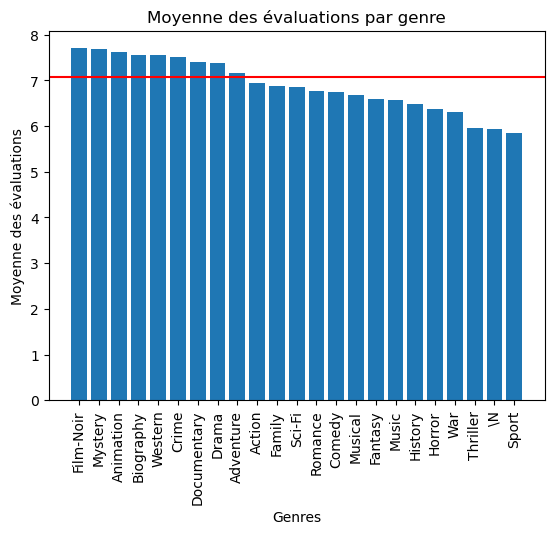

In [50]:
#AverageRating mean, round with 1 decimal, using the weighted average
avg_rating_movie = np.average(df_movie['averageRating'], weights=df_movie['numVotes'])

round(avg_rating_movie, 1)


#Creating viz

plt.bar(avg_rating_genre_sorted.index, avg_rating_genre_sorted)

plt.axhline(avg_rating_movie, color='red', linestyle='-', label='AverageRating mean')


plt.title('Moyenne des évaluations par genre')
plt.xlabel('Genres')
plt.ylabel('Moyenne des évaluations')


plt.xticks(rotation=90)


plt.show()

In [51]:
df_movie.head()

,tconst,isAdult,startYear,runtimeMinutes,genre_1,genre_2,genre_3,directors,title,averageRating,numVotes,primaryName
0,tt0000591,0,1907,90,Drama,None,None,nm0141150,L'enfant prodigue,4.4,20,Michel Carré
1,tt0433554,0,1916,\N,\N,None,None,nm0141150,L'enfant prodigue,5.1,12,Michel Carré
2,tt0000886,0,1910,\N,Drama,None,None,nm0099901,Hamlet,4.7,40,Gérard Bourgeois
3,tt0007518,0,1916,110,History,None,None,nm0099901,La Vie de Christophe Colomb,5.4,18,Gérard Bourgeois
4,tt0451296,0,1915,\N,Adventure,None,None,nm0099901,L'aventurier,5.3,13,Gérard Bourgeois


## Nombre films produits par années et par genre

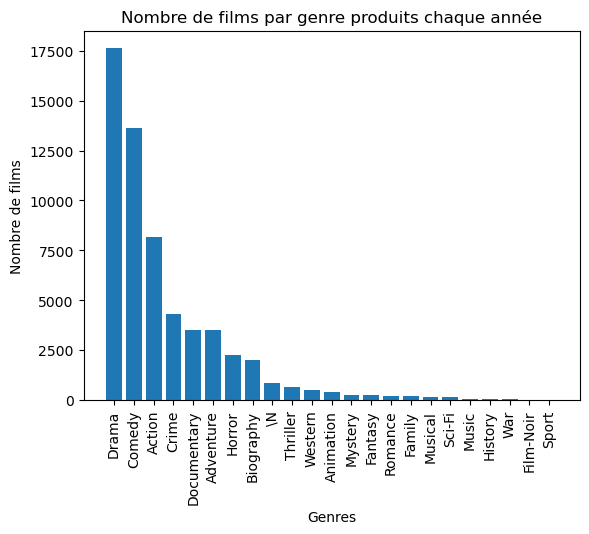

In [52]:
##Creating viz

films_per_genre_prod = df_movie.groupby('genre_1')['startYear'].count()

films_per_genre_prod = films_per_genre_prod.sort_values(ascending = False)



plt.bar(films_per_genre_prod.index, films_per_genre_prod)


plt.title('Nombre de films par genre produits chaque année')
plt.xlabel('Genres')
plt.ylabel('Nombre de films')


plt.xticks(rotation=90)


plt.show()

## Films les mieux notés tout genre confondus 

In [53]:
#Creating viz

from IPython.display import display
pd.set_option('display.max_rows', None)

# Trier les films par note moyenne en ordre décroissant
q3_numVotes = df_movie['numVotes'].quantile(0.75)
df_filtered = df_movie.loc[df_movie['numVotes'] >= q3_numVotes]
df_top_50_all_genres = df_filtered.sort_values('averageRating', ascending=False).head(50)

df_top_50_selected = df_top_50_all_genres.loc[:, ['title', 'averageRating', 'numVotes','tconst', 'startYear', 'genre_1']]
display(df_top_50_selected)

,title,averageRating,numVotes,tconst,startYear,genre_1
32170,Les Évadés,9.3,2742343,tt0111161,1994,Drama
16176,Le Parrain,9.2,1907058,tt0068646,1972,Crime
35583,The Dark Knight : Le Chevalier noir,9.0,2715176,tt0468569,2008,Action
22199,La liste de Schindler,9.0,1383789,tt0108052,1993,Biography
27921,Le Seigneur des anneaux : Le Retour du roi,9.0,1885275,tt0167260,2003,Action
12894,Douze Hommes en colère,9.0,811804,tt0050083,1957,Crime
16178,"Le Parrain, 2ᵉ partie",9.0,1299560,tt0071562,1974,Crime
46339,Kimetsu no Yaiba: Tsuzumi Yashiki Hen,8.9,18249,tt16492678,2021,Action
30893,Pulp Fiction,8.9,2107298,tt0110912,1994,Crime
30902,Kill Bill: The Whole Bloody Affair,8.8,14072,tt6019206,2006,Action


## Films les mieux notés par genre

In [54]:
#Creating viz

from IPython.display import display
pd.set_option('display.max_rows', None)

# Trier les films par genre et note moyenne en ordre décroissant pour chaque groupe
df_top_5_by_genre = df_filtered.groupby('genre_1').apply(lambda x: x.nlargest(5, 'numVotes')).reset_index(drop=True)

df_top_5_selected = df_top_5_by_genre.loc[:, ['title', 'averageRating', 'numVotes', 'tconst', 'startYear', 'genre_1']]
display(df_top_5_selected)

,title,averageRating,numVotes,tconst,startYear,genre_1
0,The Dark Knight : Le Chevalier noir,9.0,2715176,tt0468569,2008,Action
1,Inception,8.8,2410239,tt1375666,2010,Action
2,Le Seigneur des anneaux : La Communauté de l'a...,8.8,1914027,tt0120737,2001,Action
3,Le Seigneur des anneaux : Le Retour du roi,9.0,1885275,tt0167260,2003,Action
4,The Dark Knight Rises,8.4,1739892,tt1345836,2012,Action
5,Interstellar,8.7,1906823,tt0816692,2014,Adventure
6,Inglourious Basterds,8.3,1490145,tt0361748,2009,Adventure
7,Retour vers le futur,8.5,1237164,tt0088763,1985,Adventure
8,WALL·E,8.4,1141551,tt0910970,2008,Adventure
9,Toy Story,8.3,1016889,tt0114709,1995,Adventure


## Acteurs présents dans les films les + aimés

In [55]:

## Definir un nombre de vote pour dire qu'un film est populaire
q3_numVotes = df_movie['numVotes'].quantile(0.75)

## Keep only films with numVotes greater than 3rd quantile 
df_movie = df_movie.loc[df_movie["numVotes"] >= q3_numVotes, :]

## Sorted df on average rating desc
df_movie_averageRating_desc = df_movie.sort_values(by='averageRating', ascending=False)

## TOP 10 of best rated films
df_movie_top10 = df_movie_averageRating_desc.head(10)

## Get the film tconst in a list to find the actors in another table
list_tconst_top10 = df_movie_top10["tconst"].to_list()

## Actors having a role in the top 10 films
df_actor_top10 = df_actor.loc[df_actor[['film_1', 'film_2', 'film_3', 'film_4', 'film_5', 'film_6']].apply
                            (lambda row: row.isin(list_tconst_top10).any(), axis=1)]

## List of Actors having a role in the top 10 films
display(df_actor_top10["primaryName"].to_list())
##### 365 actors for the top 10 film, can't really use it #####




['Marie Osborne',
 'Joseph Sweeney',
 'George Voskovec',
 'Hanka Ordonówna',
 'Henry Fonda',
 'Sidney Lumet',
 'Lee J. Cobb',
 'Jascha Heifetz',
 'Sterling Hayden',
 'Tommy Dorsey & His Orchestra',
 'Richard Conte',
 'E.G. Marshall',
 'Don Reynolds',
 'John Marley',
 'Jack Warden',
 'Vito Scotti',
 'Ed Begley',
 'Saro Urzì',
 'James Whitmore',
 'Edward Binns',
 'John Fiedler',
 'Marlon Brando',
 'Jack Klugman',
 'Leopoldo Trieste',
 'Ricky Nelson',
 'Fay Spain',
 'Robert Webber',
 'Richard Watson',
 'Martin Balsam',
 'Chuck Berry',
 'Troy Donahue',
 'James Murdock',
 'Steven Spielberg',
 'Marianna Hill',
 'Franco Citti',
 'Gastone Moschin',
 'Michael Caine',
 'James Caan',
 'John Horton',
 'Friedrich von Thun',
 'Alex Rocco',
 'Angelo Infanti',
 'Ian McKellen',
 'Ian Holm',
 'Tom Rosqui',
 'Julie Gregg',
 'Edward Linde-Lubaszenko',
 'Richard S. Castellano',
 'Francis Ford Coppola',
 'Harvey Keitel',
 'John Rhys-Davies',
 'Andrzej Seweryn',
 'Sergio Mimica-Gezzan',
 'Talia Shire',
 'Edi

## Directeurs des 10 films les plus populaire

In [56]:
## List of directors from top 10 films
display(df_movie_top10["primaryName"].to_list())

['Frank Darabont',
 'Francis Ford Coppola',
 'Christopher Nolan',
 'Steven Spielberg',
 'Peter Jackson',
 'Sidney Lumet',
 'Francis Ford Coppola',
 'Haruo Sotozaki',
 'Quentin Tarantino',
 'Quentin Tarantino']

In [57]:
display(df_movie)

,tconst,isAdult,startYear,runtimeMinutes,genre_1,genre_2,genre_3,directors,title,averageRating,numVotes,primaryName
39,tt0018192,0,1927,330,Biography,Drama,History,nm0304098,Napoléon,8.2,8137,Abel Gance
78,tt0022074,0,1931,93,Comedy,Musical,Romance,nm0523932,Le lieutenant souriant,7.2,3982,Ernst Lubitsch
80,tt0023622,0,1932,83,Comedy,Crime,Romance,nm0523932,Haute pègre,8.0,15448,Ernst Lubitsch
81,tt0023940,0,1933,91,Comedy,Music,Mystery,nm0523932,Sérénade à trois,7.4,7271,Ernst Lubitsch
84,tt0029929,0,1938,85,Comedy,Romance,None,nm0523932,La huitième femme de Barbe-bleue,7.2,4293,Ernst Lubitsch
85,tt0031725,0,1939,110,Comedy,Romance,None,nm0523932,Ninotchka,7.8,21850,Ernst Lubitsch
86,tt0033045,0,1940,99,Comedy,Drama,Romance,nm0523932,Rendez-vous,8.0,35461,Ernst Lubitsch
88,tt0035446,0,1942,99,Comedy,Romance,War,nm0523932,Jeu dangereux,8.2,39593,Ernst Lubitsch
89,tt0035979,0,1943,112,Comedy,Drama,Fantasy,nm0523932,Le ciel peut attendre,7.4,11789,Ernst Lubitsch
90,tt0038419,0,1946,100,Comedy,Romance,War,nm0523932,La folle ingénue,7.5,3870,Ernst Lubitsch
